In [1]:
!pip install --quiet icecream segmentation_models_pytorch gdown
!apt-get install --quiet unrar

Reading package lists...
Building dependency tree...
Reading state information...
The following NEW packages will be installed:
  unrar
0 upgraded, 1 newly installed, 0 to remove and 65 not upgraded.
Need to get 113 kB of archives.
After this operation, 406 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/multiverse amd64 unrar amd64 1:5.6.6-2build1 [113 kB]
Fetched 113 kB in 1s (126 kB/s)
Selecting previously unselected package unrar.
(Reading database ... 113807 files and directories currently installed.)
Preparing to unpack .../unrar_1%3a5.6.6-2build1_amd64.deb ...
Unpacking unrar (1:5.6.6-2build1) ...
Setting up unrar (1:5.6.6-2build1) ...
update-alternatives: using /usr/bin/unrar-nonfree to provide /usr/bin/unrar (unrar) in auto mode
update-alternatives: warning: skip creation of /usr/share/man/man1/unrar.1.gz because associated file /usr/share/man/man1/unrar-nonfree.1.gz (of link group unrar) doesn't exist
Processing triggers for man-db (2.9.

## Useful libraries and modules

In [2]:
import os
import gc
import random
import time

import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler

from torchvision.transforms import transforms as T
from torchvision.utils import make_grid

from kornia.losses import FocalLoss

import albumentations as A
from albumentations.pytorch import ToTensorV2

from torchmetrics.classification import MulticlassAccuracy, MulticlassJaccardIndex, MulticlassF1Score

from icecream import ic  # icecream is a debugging tool. See https://github.com/gruns/icecream

from tqdm.auto import tqdm, trange

from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score, 
                             classification_report,
                             ConfusionMatrixDisplay,
                             f1_score, 
                             jaccard_score)

from skimage.util import view_as_windows
from skimage.io import imread

import segmentation_models_pytorch as smp

from torchinfo import summary

%config InlineBackend.figure_format = 'retina'

## Setting up parameters

In [3]:
config = {
    'seed': 2024,
    'train_batch_size': 64,
    'learning_rate': 1e-3,
    'epochs': 100,
    'patience': 10,
    'channel_n': 3,
    'patch_len': 128,
    'class_n': 5,
    'encoder_name': 'resnet50',    
    'smp_model_architecture': 'PSPNet',
    'step_size': 30, 
    'gamma':0.1,
}

## Reproducibility

In [4]:
def seed_everything(seed: int) -> None:
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(config['seed'])  

## Download data

Dataset is in https://drive.google.com/file/d/1AUkcQzHuB6EMa0OBMAahYRzxl_Vtik0-/view?usp=drive_link

In [5]:
!gdown --i 1AUkcQzHuB6EMa0OBMAahYRzxl_Vtik0-
!mkdir content
!mv images.rar ./content
!unrar -y x "./content/images.rar"
!mv images ./content

os.remove("./content/images.rar")

/opt/conda/lib/python3.10/site-packages/gdown/__main__.py:132: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1AUkcQzHuB6EMa0OBMAahYRzxl_Vtik0-
To: /kaggle/working/images.rar
100%|███████████████████████████████████████| 24.9M/24.9M [00:00<00:00, 144MB/s]

UNRAR 5.61 beta 1 freeware      Copyright (c) 1993-2018 Alexander Roshal


Extracting from ./content/images.rar

Creating    images                                                    OK
Creating    images/Images_Test                                        OK
Extracting  images/Images_Test/Image_Test.tif                             16% 33% 50% 58%  OK 
Extracting  images/Images_Test/Reference_Test.tif                         60%  OK 
Creating    images/Images_Train                                       OK
Extracting  images/Images_Train/Image_Tr

In [6]:
train_input_path = "./content/images/Images_Train/Image_Train.tif"
train_reference_path = "./content/images/Images_Train/Reference_Train.tif"

test_input_path = "./content/images/Images_Test/Image_Test.tif"
test_reference_path = "./content/images/Images_Test/Reference_Test.tif"

In [7]:
im_train = imread(train_input_path)
reference_train_rgb = imread(train_reference_path)

im_test = imread(test_input_path)
reference_test_rgb = imread(test_reference_path)


ic(im_train.shape, reference_train_rgb.shape)
ic(im_test.shape, reference_test_rgb.shape)

ic| im_train.shape: (2565, 1919, 3)
    reference_train_rgb.shape: (2565, 1919, 3)
ic| im_test.shape: (2558, 2818, 3)
    reference_test_rgb.shape: (2558, 2818, 3)


((2558, 2818, 3), (2558, 2818, 3))

## Classes are:

0.   Impervious surfaces (RGB: 255, 255, 255)
1.   Building (RGB: 0, 0, 255)
2.   Low vegetation (RGB: 0, 255, 255)
3.   Tree (RGB: 0, 255, 0)
4.   Car (RGB: 255, 255, 0)







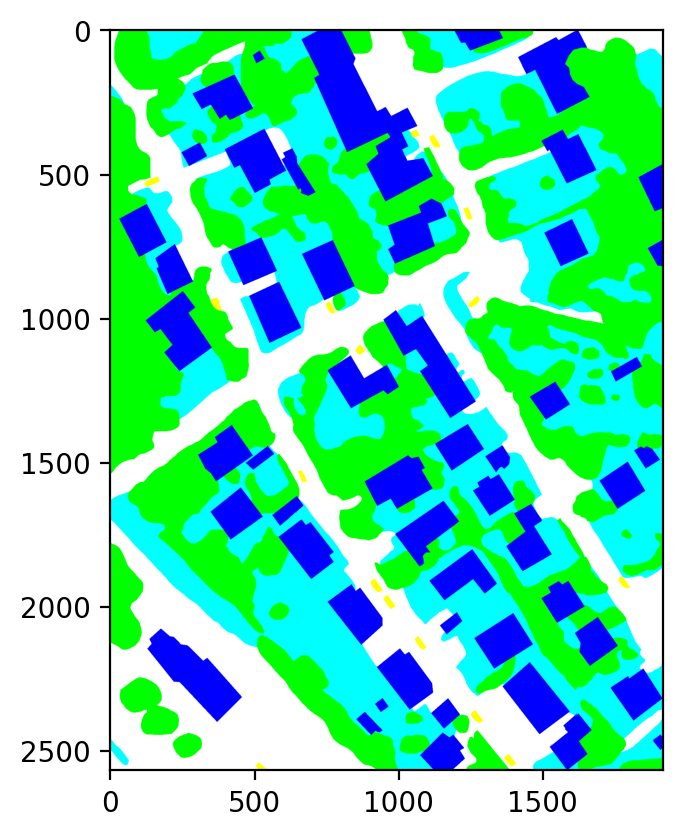

In [8]:
plt.imshow(reference_train_rgb);

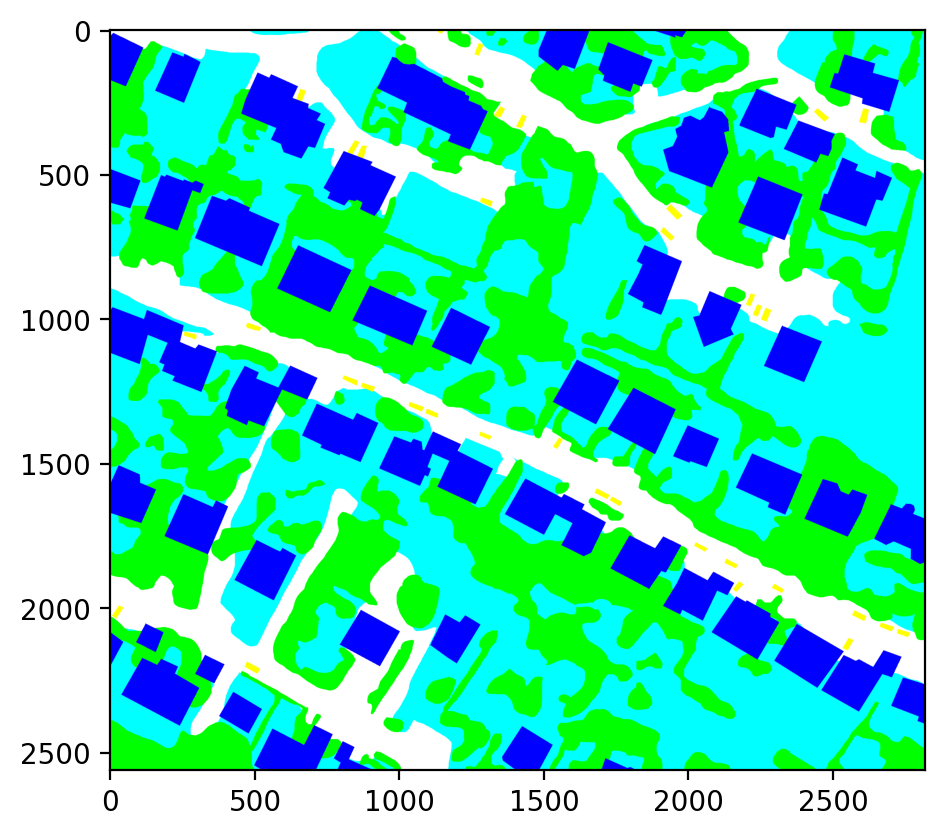

In [9]:
plt.imshow(reference_test_rgb);

## Utilities to convert reference from RGB to grayscale and from grayscale to RGB

In [10]:
def label_rgb_to_grayscale(msk):

    msk = msk.astype(np.int64)
    new = np.zeros((msk.shape[0], msk.shape[1]), dtype=np.int64)

    msk = msk // 255
    msk = msk * (1, 7, 49)
    msk = msk.sum(axis=2)

    new[msk == 1 + 7 + 49] = 0 # Street.
    new[msk ==         49] = 1 # Building.
    new[msk ==     7 + 49] = 2 # Grass.
    new[msk ==     7     ] = 3 # Tree.
    new[msk == 1 + 7     ] = 4 # Car.
    new[msk == 1         ] = 5 # Surfaces.
    new[msk == 0         ] = 6 # Boundaries.

    return new

colormap = {0: [255, 255, 255],
            1: [0  , 0  , 255],
            2: [0  , 255, 255],
            3: [0  , 255, 0  ],
            4: [255, 255,   0]}

def label_grayscale_to_rgb(label):

    msk = np.zeros((label.shape[0], label.shape[1], 3), dtype=np.uint8)

    for c in colormap.keys():
      msk[..., 0][label == c] = colormap[c][0]
      msk[..., 1][label == c] = colormap[c][1]
      msk[..., 2][label == c] = colormap[c][2]

    return msk

In [11]:
reference_train = label_rgb_to_grayscale(reference_train_rgb)
reference_test = label_rgb_to_grayscale(reference_test_rgb)

In [12]:
ic(reference_train.shape)

ic| reference_train.shape: (2565, 1919)


(2565, 1919)

## Visualize dataset

ic| np.unique(reference_train, return_counts=True): (array([0, 1, 2, 3, 4]), array([1132698,  867583, 1255273, 1653521,   13160]))
ic| np.unique(reference_test, return_counts=True): (array([0, 1, 2, 3, 4]), array([1185224, 1302768, 2549104, 2144306,   27042]))


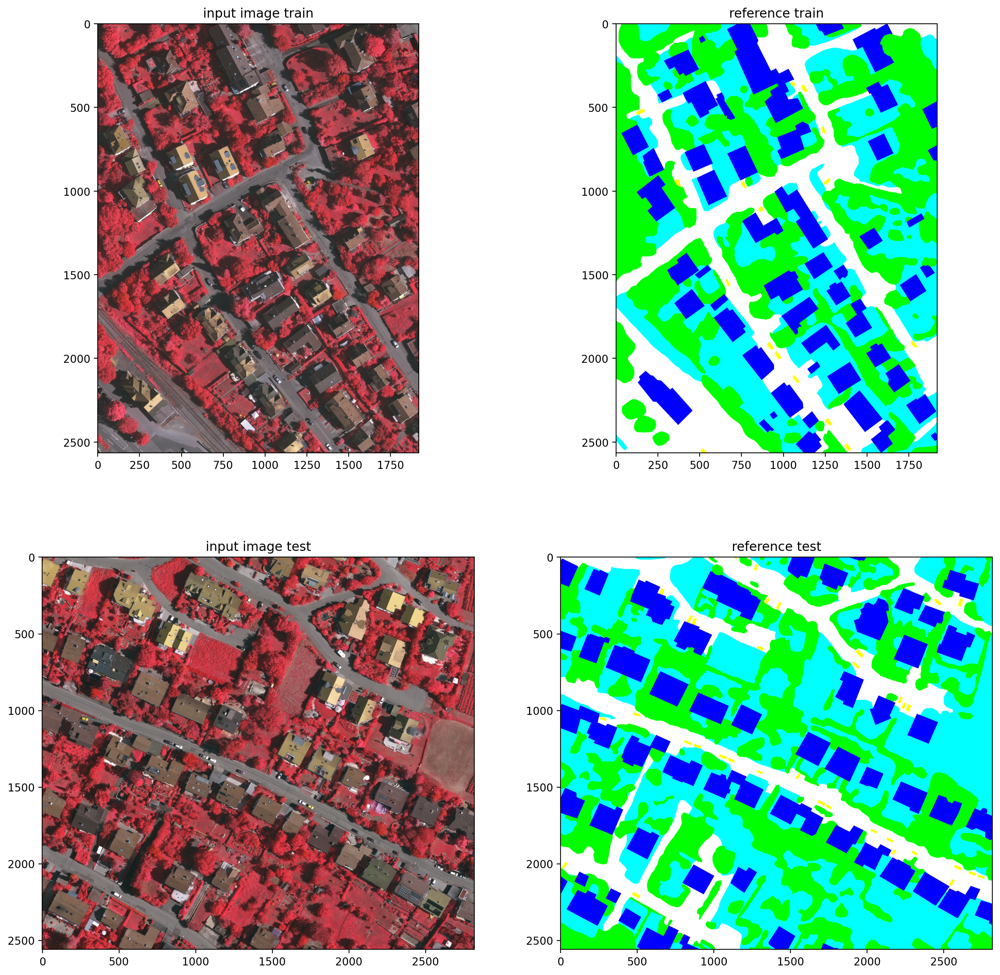

In [13]:
ic(np.unique(reference_train, return_counts=True))
ic(np.unique(reference_test, return_counts=True))

plt.figure(figsize=(16, 16))
plt.subplot(221)
plt.imshow(im_train/255)
plt.title('input image train')
plt.subplot(222)
plt.imshow(reference_train_rgb)
plt.title('reference train')

plt.subplot(223)
plt.imshow(im_test/255)
plt.title('input image test')

plt.subplot(224)
plt.imshow(reference_test_rgb)
plt.title('reference test');

## Extract image patches

We use `view_as_windows` from `skimage`. See the documentation https://scikit-image.org/docs/stable/api/skimage.util.html#skimage.util.view_as_windows

In [14]:
# train_step = patch_len // 2
config['train_step'] = config['patch_len'] // 2

ic(im_train.shape)

im_train_patch = view_as_windows(
    im_train, (config['patch_len'], config['patch_len'], config['channel_n']), step=config['train_step'],
)

reference_train_patch = view_as_windows(
    reference_train, (config['patch_len'], config['patch_len']), step=config['train_step'],
)

#del im_train, reference_train

im_train_patch = im_train_patch.reshape(
    -1, config['patch_len'], config['patch_len'], config['channel_n'],
)

reference_train_patch = reference_train_patch.reshape(
    -1, config['patch_len'], config['patch_len']
)

ic(im_train_patch.shape)
ic(reference_train_patch.shape)

print("Number of training patches:", im_train_patch.shape[0])

ic| im_train.shape: (2565, 1919, 3)
ic| im_train_patch.shape: (1092, 128, 128, 3)
ic| reference_train_patch.shape: (1092, 128, 128)


Number of training patches: 1092


## Convert labels to one-hot

In [15]:
# class_n = len(np.unique(reference_train))
ic(np.unique(reference_test))
def to_one_hot(reference, class_n):
    b = np.zeros((reference.size, class_n))
    b[np.arange(reference.size), reference] = 1
    return b

def patches_to_one_hot(reference_patch, class_n):
    shape = reference_patch.shape
    reference_patch = to_one_hot(reference_patch.flatten(), class_n)
    reference_patch = reference_patch.reshape((*shape, class_n))
    return reference_patch

reference_train_patch = patches_to_one_hot(reference_train_patch, 
                                           config['class_n'])
ic(reference_train_patch.shape)
ic(config['class_n'])

ic| np.unique(reference_test): array([0, 1, 2, 3, 4])
ic| reference_train_patch.shape: (1092, 128, 128, 5)
ic| config['class_n']: 5


5

## Split training patches into 80% for training and 20% for validation

In [16]:
# Assuming your train input and reference are already tensors
train_input = im_train_patch
train_reference = reference_train_patch

# Split data into training and validation sets (80%/20%)
train_input, val_input, train_reference, val_reference = train_test_split(train_input,
                                                                          train_reference, 
                                                                          test_size=0.2, 
                                                                          random_state=config['seed'])

# Sanity check
train_input.shape, train_reference.shape, val_input.shape, val_reference.shape

((873, 128, 128, 3),
 (873, 128, 128, 5),
 (219, 128, 128, 3),
 (219, 128, 128, 5))

## Dealing with imbalanced dataset

In [17]:
# https://discuss.pytorch.org/t/how-to-handle-imbalanced-classes/11264/64?page=4
def compute_weight(one_hot_reference: np.array) -> np.array:
    labels_ = one_hot_reference[:, 0, 0, :].argmax(axis=-1)
    _, class_sample_count = np.unique(labels_, return_counts=True)
    weight = 1. / class_sample_count

    return weight


In [18]:
def compute_sampler(one_hot_reference: np.array) -> torch.tensor:
    weight = compute_weight(one_hot_reference)
    target = one_hot_reference[:, 0, 0, :].argmax(axis=-1)
    samples_weight = np.array([weight[t] for t in target])
    samples_weight = torch.from_numpy(samples_weight)

    sampler = WeightedRandomSampler(samples_weight, 
                                    len(samples_weight), 
                                    replacement=True)
    
    return sampler


In [19]:
sampler = compute_sampler(train_reference)

## Define the Pytorch DataLoader for training and validation

Hint: Remember to normalize the input images. Each encoder has its own normalization parameters, obtained as:

`params = smp.encoders.get_preprocessing_params(encoder_name)`

Where mean and std parameters will be `params['mean']` and `params['std']`, respectively.

See the class hands-on for more details.

In [20]:
params = smp.encoders.get_preprocessing_params(config['encoder_name'])

config['mean'] = params['mean']  # [0.485, 0.456, 0.406],
config['std'] = params['std']    # [0.229, 0.224, 0.225]

# Define separate datasets for training and validation
class CustomDataset(Dataset):
    def __init__(self, input, reference, transform=None, transform_reference=None):
        self.input = input
        self.reference = reference
        self.transform = transform
        self.transform_reference = transform_reference
    def __len__(self):
        return len(self.input)

    def __getitem__(self, idx):
        image = self.input[idx]
        label = self.reference[idx]
        
        # Apply the transform to the image
        if self.transform is not None:
            image = self.transform(image)
        if self.transform_reference is not None:
            label = self.transform_reference(label)
        return image, label


# Define a transform that first converts the image to a tensor and then normalizes it
transform = T.Compose([
    T.ToTensor(),                                        # Converts to tensor
    T.Normalize(mean=config['mean'], std=config['std'])  # Normalize
])

transform_reference = T.ToTensor()

# Create training and validation dataset instances
train_dataset = CustomDataset(
    train_input, train_reference, transform=transform, transform_reference=transform_reference,
)
val_dataset = CustomDataset(
    val_input, val_reference, transform=transform, transform_reference=transform_reference,
)

# Create separate DataLoaders for training and validation
train_loader = DataLoader(train_dataset, batch_size=config['train_batch_size'], 
                          shuffle=False,                           # "sampler option is mutually exclusive with shuffle"
                          sampler=sampler)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)  # Don't shuffle validation data

## Viewing a batch of images

In [21]:
images_, labels_ = next(iter(train_loader))
images_.shape, labels_.shape

(torch.Size([64, 3, 128, 128]), torch.Size([64, 5, 128, 128]))

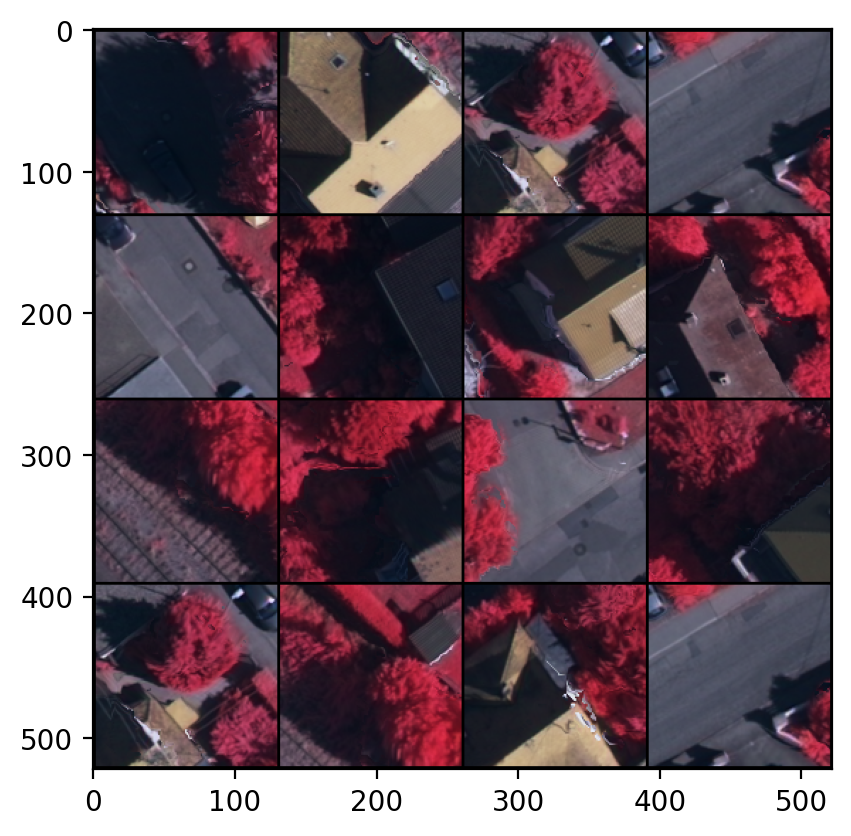

In [22]:
img_grid = make_grid(images_[:16], nrow=4, normalize=True)

plt.imshow(img_grid.permute(1, 2, 0));

## Define your model using SMP

In [23]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# You: Define model architecture
model = getattr(smp, config['smp_model_architecture'])(
    encoder_name=config['encoder_name'],  # Choose from various encoders (e.g., resnet18)
    encoder_weights="imagenet",           # Load pretrained encoder weights (optional)
    in_channels=config['channel_n'],
    classes=config['class_n'],            # Number of segmentation classes
)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 99.8MB/s]


In [24]:
print(f"Normalization mean: {params['mean']}, std: {params['std']}")

Normalization mean: [0.485, 0.456, 0.406], std: [0.229, 0.224, 0.225]


In [25]:
print(summary(model, (64, 3, 128, 128), col_names=["input_size", "output_size", "num_params","trainable"], device='cpu'))

Layer (type:depth-idx)                                  Input Shape               Output Shape              Param #                   Trainable
PSPNet                                                  [64, 3, 128, 128]         [64, 5, 128, 128]         --                        True
├─ResNetEncoder: 1-1                                    [64, 3, 128, 128]         [64, 3, 128, 128]         22,063,104                True
│    └─Conv2d: 2-1                                      [64, 3, 128, 128]         [64, 64, 64, 64]          9,408                     True
│    └─BatchNorm2d: 2-2                                 [64, 64, 64, 64]          [64, 64, 64, 64]          128                       True
│    └─ReLU: 2-3                                        [64, 64, 64, 64]          [64, 64, 64, 64]          --                        --
│    └─MaxPool2d: 2-4                                   [64, 64, 64, 64]          [64, 64, 32, 32]          --                        --
│    └─Sequential: 2-5    

## Definition of early stopping.

Use as in the next example https://github.com/Bjarten/early-stopping-pytorch/blob/master/MNIST_Early_Stopping_example.ipynb

In [26]:
class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement.
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

In [27]:
def get_model_parameters(m):
    total_params = sum(
        param.numel() for param in m.parameters()
    )
    return total_params

def print_model_parameters(m):
    num_model_parameters = get_model_parameters(m)
    print(f"The Model has {num_model_parameters/1e6:.2f}M parameters")

In [28]:
print_model_parameters(model)

The Model has 24.32M parameters


## Define your training loop.

1. You can reuse code from the class hands-on https://colab.research.google.com/drive/1XVEgeZotsafKc5cQJI8I4_sPygcsd_q4?usp=sharing

2. The next link contains another training example using Pytorch. Use early stopping on the validation set as in https://github.com/Bjarten/early-stopping-pytorch/blob/master/MNIST_Early_Stopping_example.ipynb


In [29]:
def train_fn(model, dataloader, optimizer, criterion, class_n):
    
    scaler = torch.cuda.amp.GradScaler()  # deal with out of memory 

    model.train()
    
    running_loss = 0.
    for images, labels in tqdm(dataloader, leave=False):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        # Forward pass
        with torch.cuda.amp.autocast():  # autocasting
            outputs = model(images)
            loss = criterion(outputs, labels)        
        
        # Backward pass
        scaler.scale(loss).backward() 
        scaler.step(optimizer)
        scaler.update()

        # Update metrics
        running_loss += loss.item()
        
        torch.cuda.empty_cache()
        _ = gc.collect()
        
    return running_loss / len(dataloader)


In [30]:
@torch.no_grad()
def eval_fn(model, dataloader, criterion, class_n):
    
    model.eval()    

    running_loss = 0.
    for images, labels in tqdm(dataloader, leave=False):
        images = images.to(device)
        labels = labels.to(device)             # [B, 5, 128, 128]

        # Forward pass
        with torch.cuda.amp.autocast():
            outputs = model(images)            # [B, 5, 128, 128]
            loss = criterion(outputs, labels)

        # Compute metrics
        running_loss += loss.item()
        
        torch.cuda.empty_cache()
        _ = gc.collect()
        
    return running_loss / len(dataloader)

In [31]:
weight = compute_weight(train_reference)
weight = torch.tensor(weight, dtype=torch.float32, device=device)
print(weight)

tensor([0.0051, 0.0061, 0.0045, 0.0035, 0.5000], device='cuda:0')


In [32]:
model.to(device)

optimizer = optim.Adam(model.parameters(), lr=config['learning_rate'])
criterion = nn.CrossEntropyLoss(weight=weight, reduction='mean')

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 
                                            step_size=config['step_size'], 
                                            gamma=config['gamma'])

## Training and evaluating the model

In [33]:
%%time
'''
# Training loop (example)
for train_batch, reference_batch in train_loader:
    # Your training logic here
    # ...
'''

t0 = time.time()

# initialize the early_stopping object
early_stopping = EarlyStopping(patience=config['patience'], verbose=True)
history = {
    'train_loss': [],
    'valid_loss': [],
}
for epoch in trange(config['epochs']):
    
    train_loss = train_fn(model, train_loader, optimizer, criterion, config['class_n'])
    valid_loss = eval_fn(model, val_loader, criterion, config['class_n'])
    
    print(f"Epoch: {epoch + 1:>03}, Learning Rate: {optimizer.param_groups[0]['lr']}")
    print(f'train loss: {train_loss:8.5f} | val loss: {valid_loss:8.5f}')
    
    if scheduler is not None:
        scheduler.step()

    # early_stopping needs the validation loss to check if it has decresed,
    # and if it has, it will make a checkpoint of the current model
    early_stopping(valid_loss, model)

    history['train_loss'].append(train_loss)
    history['valid_loss'].append(valid_loss)

    if early_stopping.early_stop:
        print("Early stopping")
        break
        
print(f"\nExecution time: {time.time() - t0:.5f}\n")

# load the last checkpoint with the best model
model.load_state_dict(torch.load('checkpoint.pt'))

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 001, Learning Rate: 0.001
train loss:  0.00493 | val loss:  0.00575
Validation loss decreased (inf --> 0.005751).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 002, Learning Rate: 0.001
train loss:  0.00244 | val loss:  0.00268
Validation loss decreased (0.005751 --> 0.002681).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 003, Learning Rate: 0.001
train loss:  0.00176 | val loss:  0.00249
Validation loss decreased (0.002681 --> 0.002492).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 004, Learning Rate: 0.001
train loss:  0.00160 | val loss:  0.00186
Validation loss decreased (0.002492 --> 0.001862).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 005, Learning Rate: 0.001
train loss:  0.00138 | val loss:  0.00202
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 006, Learning Rate: 0.001
train loss:  0.00128 | val loss:  0.00186
Validation loss decreased (0.001862 --> 0.001862).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 007, Learning Rate: 0.001
train loss:  0.00104 | val loss:  0.00174
Validation loss decreased (0.001862 --> 0.001743).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 008, Learning Rate: 0.001
train loss:  0.00094 | val loss:  0.00151
Validation loss decreased (0.001743 --> 0.001514).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 009, Learning Rate: 0.001
train loss:  0.00088 | val loss:  0.00151
Validation loss decreased (0.001514 --> 0.001507).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 010, Learning Rate: 0.001
train loss:  0.00077 | val loss:  0.00139
Validation loss decreased (0.001507 --> 0.001390).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 011, Learning Rate: 0.001
train loss:  0.00076 | val loss:  0.00126
Validation loss decreased (0.001390 --> 0.001265).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 012, Learning Rate: 0.001
train loss:  0.00072 | val loss:  0.00152
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 013, Learning Rate: 0.001
train loss:  0.00062 | val loss:  0.00139
EarlyStopping counter: 2 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 014, Learning Rate: 0.001
train loss:  0.00059 | val loss:  0.00105
Validation loss decreased (0.001265 --> 0.001054).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 015, Learning Rate: 0.001
train loss:  0.00055 | val loss:  0.00105
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 016, Learning Rate: 0.001
train loss:  0.00054 | val loss:  0.00140
EarlyStopping counter: 2 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 017, Learning Rate: 0.001
train loss:  0.00056 | val loss:  0.00133
EarlyStopping counter: 3 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 018, Learning Rate: 0.001
train loss:  0.00052 | val loss:  0.00102
Validation loss decreased (0.001054 --> 0.001019).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 019, Learning Rate: 0.001
train loss:  0.00049 | val loss:  0.00100
Validation loss decreased (0.001019 --> 0.001004).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 020, Learning Rate: 0.001
train loss:  0.00044 | val loss:  0.00083
Validation loss decreased (0.001004 --> 0.000828).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 021, Learning Rate: 0.001
train loss:  0.00040 | val loss:  0.00084
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 022, Learning Rate: 0.001
train loss:  0.00041 | val loss:  0.00092
EarlyStopping counter: 2 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 023, Learning Rate: 0.001
train loss:  0.00038 | val loss:  0.00082
Validation loss decreased (0.000828 --> 0.000822).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 024, Learning Rate: 0.001
train loss:  0.00036 | val loss:  0.00077
Validation loss decreased (0.000822 --> 0.000775).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 025, Learning Rate: 0.001
train loss:  0.00033 | val loss:  0.00075
Validation loss decreased (0.000775 --> 0.000753).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 026, Learning Rate: 0.001
train loss:  0.00033 | val loss:  0.00078
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 027, Learning Rate: 0.001
train loss:  0.00036 | val loss:  0.00081
EarlyStopping counter: 2 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 028, Learning Rate: 0.001
train loss:  0.00033 | val loss:  0.00079
EarlyStopping counter: 3 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 029, Learning Rate: 0.001
train loss:  0.00035 | val loss:  0.00079
EarlyStopping counter: 4 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 030, Learning Rate: 0.001
train loss:  0.00035 | val loss:  0.00088
EarlyStopping counter: 5 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 031, Learning Rate: 0.0001
train loss:  0.00030 | val loss:  0.00072
Validation loss decreased (0.000753 --> 0.000719).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 032, Learning Rate: 0.0001
train loss:  0.00027 | val loss:  0.00067
Validation loss decreased (0.000719 --> 0.000668).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 033, Learning Rate: 0.0001
train loss:  0.00026 | val loss:  0.00067
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 034, Learning Rate: 0.0001
train loss:  0.00026 | val loss:  0.00064
Validation loss decreased (0.000668 --> 0.000642).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 035, Learning Rate: 0.0001
train loss:  0.00025 | val loss:  0.00066
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 036, Learning Rate: 0.0001
train loss:  0.00025 | val loss:  0.00064
Validation loss decreased (0.000642 --> 0.000637).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 037, Learning Rate: 0.0001
train loss:  0.00024 | val loss:  0.00064
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 038, Learning Rate: 0.0001
train loss:  0.00023 | val loss:  0.00063
Validation loss decreased (0.000637 --> 0.000633).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 039, Learning Rate: 0.0001
train loss:  0.00024 | val loss:  0.00064
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 040, Learning Rate: 0.0001
train loss:  0.00022 | val loss:  0.00063
Validation loss decreased (0.000633 --> 0.000633).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 041, Learning Rate: 0.0001
train loss:  0.00023 | val loss:  0.00064
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 042, Learning Rate: 0.0001
train loss:  0.00023 | val loss:  0.00064
EarlyStopping counter: 2 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 043, Learning Rate: 0.0001
train loss:  0.00023 | val loss:  0.00062
Validation loss decreased (0.000633 --> 0.000618).  Saving model ...


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 044, Learning Rate: 0.0001
train loss:  0.00022 | val loss:  0.00065
EarlyStopping counter: 1 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 045, Learning Rate: 0.0001
train loss:  0.00022 | val loss:  0.00064
EarlyStopping counter: 2 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 046, Learning Rate: 0.0001
train loss:  0.00023 | val loss:  0.00063
EarlyStopping counter: 3 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 047, Learning Rate: 0.0001
train loss:  0.00022 | val loss:  0.00065
EarlyStopping counter: 4 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 048, Learning Rate: 0.0001
train loss:  0.00023 | val loss:  0.00062
EarlyStopping counter: 5 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 049, Learning Rate: 0.0001
train loss:  0.00023 | val loss:  0.00065
EarlyStopping counter: 6 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 050, Learning Rate: 0.0001
train loss:  0.00021 | val loss:  0.00063
EarlyStopping counter: 7 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 051, Learning Rate: 0.0001
train loss:  0.00022 | val loss:  0.00063
EarlyStopping counter: 8 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 052, Learning Rate: 0.0001
train loss:  0.00021 | val loss:  0.00064
EarlyStopping counter: 9 out of 10


  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/219 [00:00<?, ?it/s]

Epoch: 053, Learning Rate: 0.0001
train loss:  0.00021 | val loss:  0.00064
EarlyStopping counter: 10 out of 10
Early stopping

Execution time: 3128.32654

CPU times: user 54min 56s, sys: 1min, total: 55min 56s
Wall time: 52min 8s


<All keys matched successfully>

## The loss evolution

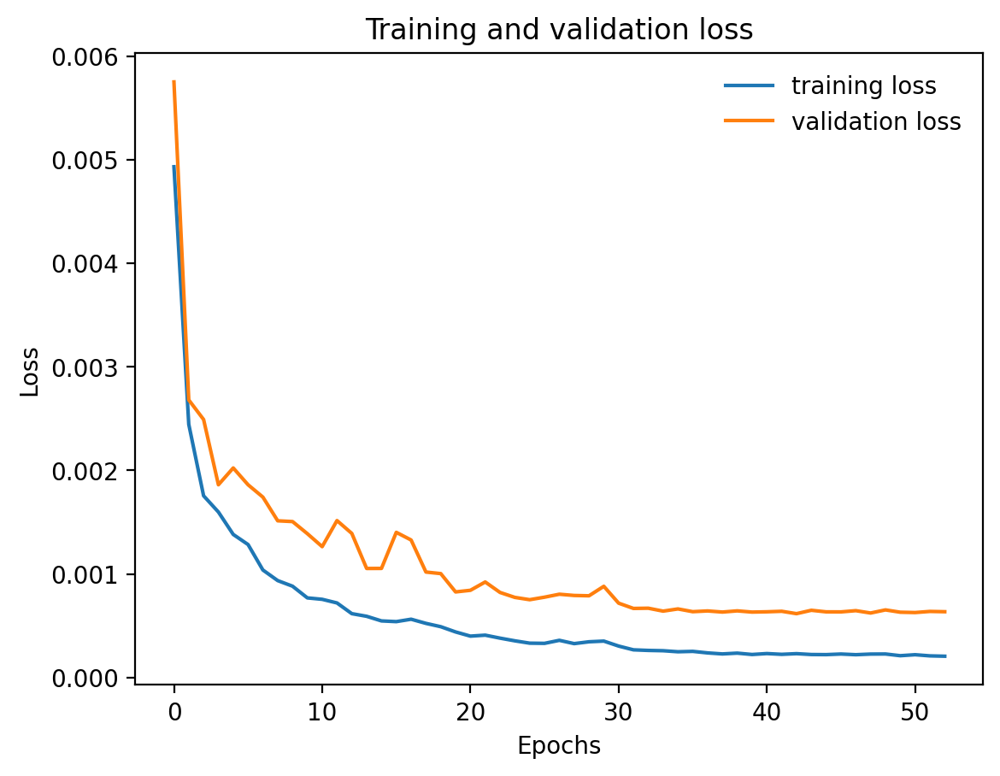

In [34]:
plt.plot(range(epoch + 1), history['train_loss'], label='training loss')
plt.plot(range(epoch + 1), history['valid_loss'], label='validation loss')

plt.title('Training and validation loss')
plt.xlabel('Epochs')

plt.ylabel('Loss')
plt.legend(frameon=False);

## Evaluate the test set

The function `patch_inference()` performs inference on an image using a patch-based approach. If you have any problems with this function, please contact me at cmjorgeandres@gmail.com.

In [35]:
def patch_inference(image, model, patch_len, overlap_percentage, class_n, device, channel_n):

    """
    This function performs inference on an image using a patch-based approach.

    Args:
        image: A NumPy array representing the input image. Expected shape is (height, width, channels).
        model: A PyTorch model for making predictions on image patches.
        patch_len: The size (length and width) of square image patches to use.
        overlap_percentage: The percentage overlap between consecutive patches (0 to 1).

    Returns:
        A NumPy array representing the predicted probability map for each class.
        The shape will match the original image.
    """
    model.to(device)
    model.eval()

    rows, cols, _ = image.shape
    """
    Everything  in this function is made operating with
    the upper left corner of the patch
    """

    # Percent of overlap between consecutive patches.
    overlap = round(patch_len * overlap_percentage)
    overlap -= overlap % 2
    stride = patch_len - overlap
    # Add Padding to the image to match with the patch size
    step_row = (stride - rows % stride) % stride
    step_col = (stride - cols % stride) % stride
    pad_tuple_msk = ( (overlap//2, overlap//2 + step_row), ((overlap//2, overlap//2 + step_col)), (0,0) )
    image_pad = np.pad(image, pad_tuple_msk, mode = 'symmetric')
    row_pad, col_pad, _ = image_pad.shape

    output_mosaic = np.zeros((row_pad,col_pad,class_n))

    k1, k2 = (rows+step_row)//stride, (cols+step_col)//stride
    print('Total number of patches: %d x %d' %(k1, k2))


    for i in range(k1):
        for j in range(k2):

            # Get input image patch
            patch = image_pad[i*stride:i*stride + patch_len, j*stride:j*stride + patch_len] # shape: (patch_len, patch_len, class_n)

            patch = np.transpose(patch, (2, 0, 1)) # shape: (class_n, patch_len, patch_len)
            patch = patch.reshape((1, channel_n, patch_len, patch_len)) # shape: (1, class_n, patch_len, patch_len)

            # convert patch to Torch tensor
            patch = torch.from_numpy(patch).float()
            patch = patch.to(device)

            pred_prob_patch = model(patch)
            pred_prob_patch = pred_prob_patch.squeeze().cpu().detach().numpy().squeeze() # shape: (class_n, patch_len, patch_len)


            pred_prob_patch = np.transpose(pred_prob_patch, (1,2,0)) # shape: (patch_len, patch_len, class_n)

            output_mosaic[i*stride:i*stride + patch_len, j*stride:j*stride + patch_len,:] = pred_prob_patch.copy()
    output_mosaic = output_mosaic[:image.shape[0], :image.shape[1]] # unpad result
    return output_mosaic

`overlap_percentage` indicates the amount of overlap between inference sub-images. A larger overlap may yield a better result, but may result in higher processing times.

Hint: Remember to normalize the input images before running inference. Each encoder has its own normalization parameters, obtained as:

`params = smp.encoders.get_preprocessing_params(encoder_name)`

Where mean and std parameters will be `params['mean']` and `params['std']`, respectively.

See the class hands-on for more details.

In [36]:
def normalize_image(img, mean=config['mean'], std=config['std']):
  img = img/255.0
  for channel in range(3):
    img[..., channel] -= mean[channel]
    img[..., channel] /= std[channel]
  return img

In [37]:
im_test_norm = normalize_image(im_test, mean=config['mean'], std=config['std']) # You: Normalize input image

In [38]:
overlap_percentage = 0.

result = patch_inference(im_test_norm, 
                         model, 
                         patch_len=config['patch_len'],
                         overlap_percentage=overlap_percentage,
                         class_n=config['class_n'],
                         device=device, 
                         channel_n=config['channel_n'])

result = result[:im_test_norm.shape[0], :im_test_norm.shape[1]]

Total number of patches: 20 x 23


In [39]:
result = result.argmax(axis=-1)

In [40]:
result.shape

(2558, 2818)

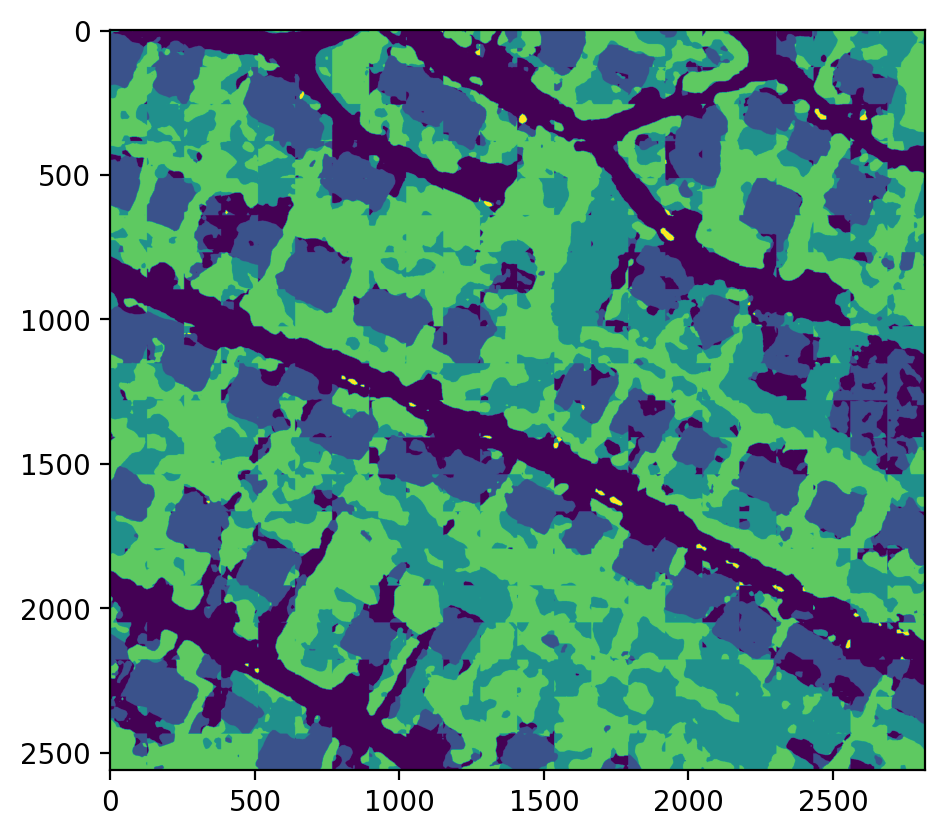

In [41]:
plt.imshow(result);

## The result of the segmentation

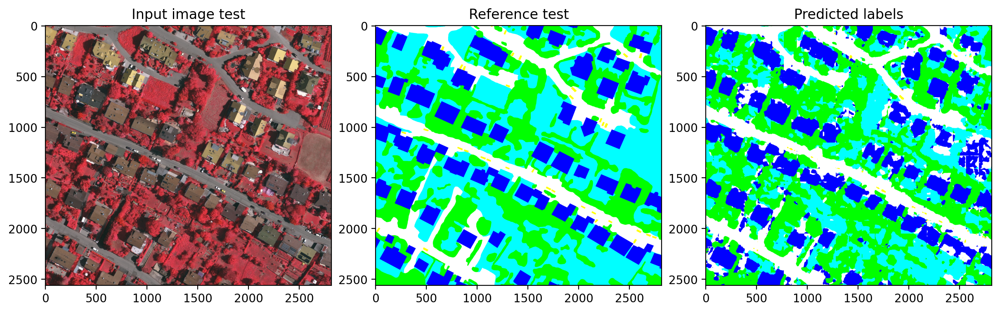

In [42]:
fig, ax = plt.subplots(1, 3, figsize=[12, 4], layout='constrained')

ax[0].imshow(im_test/255)
ax[0].set_title('Input image test')
ax[1].imshow(reference_test_rgb)
ax[1].set_title('Reference test')
ax[2].imshow(label_grayscale_to_rgb(result))
ax[2].set_title('Predicted labels');

## Calculate test metrics
Metrics must be calculated on the reconstructed (large) image

Hint: Use sklearn library

* Accuracy: sklearn.metrics.accuracy_score https://scikit-learn.org/stable/modules/generated/sklearn.metrics.accuracy_score.html
* F1-score: sklearn.metrics.f1_score: Use average=None for individual per-class values. Use average='macro' for class average F1-score. https://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html
* mIoU: sklearn.metrics.jaccard_score: Use average='macro' for mIoU (Mean intersection over union) https://scikit-learn.org/stable/modules/generated/sklearn.metrics.jaccard_score.html

In [43]:
# You: Calculate test metrics. Hint: Use sklearn library
# Use as "y_true" the variable "reference_test", and as "y_pred" the variable "result"
y_true = reference_test.flat
y_pred = result.flat

accuracy = accuracy_score(y_true, y_pred)
f1_per_class = f1_score(y_true=y_true, y_pred=y_pred, average=None)
impervious_surfaces, building, low_vegetation, tree, car = f1_per_class

f1_macro = f1_score(y_true=y_true, y_pred=y_pred, average='macro')
mIoU = jaccard_score(y_true=y_true, y_pred=y_pred, average='macro')

print('F1 score per-class:\n',
       f'Impervious surfaces: {impervious_surfaces:.5f}', 
       f'Building: {building:.5f}',
       f'Low vegetation: {low_vegetation:.5f}',
       f'Tree: {tree:.5f}',
       f'Car: {car:.5f}', sep='\n')

print('\n\nAverage metrics:\n', f'Accuracy: {accuracy:.5f}', f'mIoU: {mIoU:.5f}', f'F1 score: {f1_macro:.5f}', sep='\n')

F1 score per-class:

Impervious surfaces: 0.76587
Building: 0.82341
Low vegetation: 0.62828
Tree: 0.78337
Car: 0.46114


Average metrics:

Accuracy: 0.74328
mIoU: 0.54440
F1 score: 0.69242
